In [2]:
#This is a notebook to run a simple binary classification algorithm, using Decision Trees.

#Author: Viviana Acquaviva
#License: BSD but really should be TBD - just be nice.

import pandas as pd
import numpy as np
import sklearn.tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics 
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
from sklearn.tree import export_graphviz

#Notes: 

#Data come from here
#from astroML.datasets import fetch_rrlyrae_combined
#X, y = fetch_rrlyrae_combined()

#As I was browsing around, I found some useful examples here:
#https://towardsdatascience.com/scikit-learn-decision-trees-explained-803f3812290d
#https://medium.com/@rnbrown/creating-and-visualizing-decision-trees-with-python-f8e8fa394176

In [3]:
#Let's read in the data in a data frame, and take a look at them

Train = pd.read_csv('RRLTrainSet.csv', index_col = 0)
Test = pd.read_csv('RRLTestSet.csv', index_col = 0)

In [4]:
Train.head()

,g-r,r-i,i-z,u-g,label
0,1.072,0.114,0.127,0.393,0
1,0.995,-0.009,-0.035,0.077,1
2,1.131,0.037,-0.018,0.154,1
3,1.046,0.039,0.019,0.118,1
4,0.880,0.150,0.035,0.321,0


In [5]:
Test.drop(['label'],axis = 1)

,g-r,r-i,i-z,u-g
0,1.004,0.140,-0.005,0.376
1,0.918,0.137,0.050,0.338
2,1.105,-0.004,-0.014,0.055
3,1.037,0.137,0.027,0.362
4,0.881,0.084,0.073,0.278
5,1.044,0.089,0.006,0.297
6,0.938,0.118,0.024,0.261
7,0.967,0.180,0.130,0.390


In [6]:
Test

,g-r,r-i,i-z,u-g,label
0,1.004,0.140,-0.005,0.376,0
1,0.918,0.137,0.050,0.338,0
2,1.105,-0.004,-0.014,0.055,1
3,1.037,0.137,0.027,0.362,0
4,0.881,0.084,0.073,0.278,0
5,1.044,0.089,0.006,0.297,0
6,0.938,0.118,0.024,0.261,0
7,0.967,0.180,0.130,0.390,0


In [7]:
#This builds the four arrays (features/labels x train/test) needed by all sklearn ML models

X_train = Train.drop(['label'], axis=1)
y_train = Train['label']

X_test = Test.drop(['label'], axis=1)
y_test = Test['label']

### First model alert!

This is how we build a model in sklearn. For reproducibility purposes, we will fix the random seed in the Decision Tree. But what is randomized in Decision Trees?


From the docs: The features are always randomly permuted at each split. 
Therefore, the best found split may vary, even with the same training data 
and max_features=n_features, if the improvement of the criterion is identical 
for several splits enumerated during the search of the best split. 
To obtain a deterministic behaviour during fitting, random_state has to be fixed.

In [8]:
#Fill
model = DecisionTreeClassifier(random_state = 5)

In [9]:
model

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=5,
            splitter='best')

You might recognize a few familiar attributes up there.

And this is how we fit a model! Fitting a model means that we build the architecture to make decisions.

In [10]:
#Fill

model.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=5,
            splitter='best')

At this point, the model has built a set of questions (splits) that would inform the classification.

This bit below is to visualize the tree.

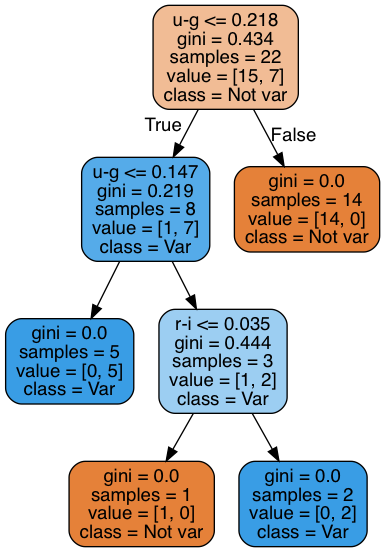

In [11]:
dot_data = StringIO()
export_graphviz(
            model,
            out_file =  dot_data,
            feature_names = list(X_train.columns),
            class_names = ['Not var','Var'],
            filled = True,
rounded = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Questions: 

What is the accuracy score (% of correct classifications) on the training set, based on the tree? 100%!
    
How can we visualize it?

How can we figure out the accuracy on the test set?

In [12]:
#Fill!

metrics.accuracy_score(y_train, model.predict(X_train))


1.0

In [13]:

metrics.accuracy_score(y_test, model.predict(X_test))

1.0

This cell below shows us the splits made by the decision tree above.

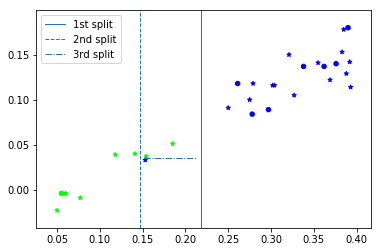

In [14]:
#Fill splits

#Plots training data
plt.scatter(X_train['u-g'], X_train['r-i'], \
            c = y_train, marker = '*', s =20, label = None, cmap = 'brg')
plt.axvline(x= 0.218  , linewidth =1, label = '1st split')
plt.axvline(x= 0.147  , linewidth =1, ls = '--', label = '2nd split')
plt.axhline(y= 0.035  , linewidth =1, ls = '-.', xmin = 0.32, xmax=0.48, label = '3rd split')

#Plots test data
plt.scatter(X_test['u-g'], X_test['r-i'], \
            c = y_test, marker = 'o', s =20, label = None, cmap = 'brg')

plt.legend();

### Ok, now time to get real!

In [15]:
Xbig = pd.read_csv('RRLyrae_features.txt', names = ['u-g', 'g-r', 'r-i', 'i-z'])
ybig = pd.read_csv('RRLyrae_labels.txt', header = None).astype(int)

Let's plot ALL the data, ahem!

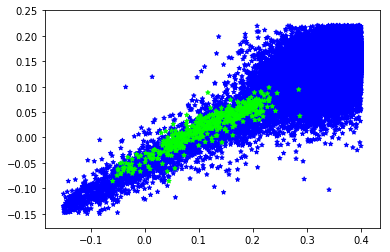

In [16]:
plt.scatter(Xbig['u-g'], Xbig['r-i'], \
            c = ybig.iloc[:,0].values, marker = '*', s =20, label = None, cmap = 'brg')

In [17]:
ybig.sum() #positive instances


0    483
dtype: int64

In [18]:
ybig.size

93141

### Let's do some data thinking.

<br>
What can we say about this data set?

Do you expect a decision tree to be an optimal classifier, based on the shape of the data?

How would a classifier that puts everything in the "non-RR Lyrae" box fare on this data set?

In [19]:
#Answers go here :) 

# Very imbalanced, decision tree not optimal, lazy classifier would have (93141-483)/93141 accuracy!


In [20]:
(93141-483)/93141

0.99481431378233

Let's take a look at how our previous algorithm would fare on this data set.

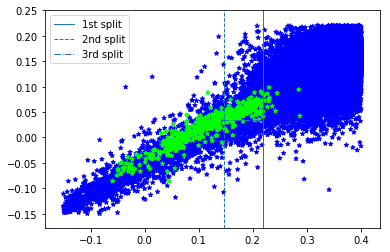

In [21]:
plt.scatter(Xbig['u-g'], Xbig['r-i'], \
            c = ybig.iloc[:,0].values, marker = '*', s =20, label = None, cmap = 'brg')
plt.axvline(x=0.218, linewidth =1, label = '1st split')
plt.axvline(x=0.147, linewidth =1, ls = '--', label = '2nd split')
plt.axhline(y=0.035, linewidth =1, ls = '-.', xmin = 0.53, xmax=0.65, label = '3rd split')
plt.legend();

Question: How is our old tree doing? What is it getting right and wrong?

In [22]:
#Answers go here. 
#Not so well I'm afraid :)

Let's do our training process again! Here we don't have separate train and test splits so we can create them, we'll call them X_trainb, X_testb etc (for "big"). Note: we are not doing cross validation yet, which is bad!

In [85]:
#Fill

X_trainb, X_testb, y_trainb, y_testb = train_test_split(Xbig, ybig, random_state = 5)


In [86]:
X_testb.shape

(23286, 4)

Define and fit the model:

In [87]:
#Fill

modelbig = DecisionTreeClassifier(random_state = 5)

modelbig.fit(X_trainb, y_trainb)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=5,
            splitter='best')

We can use the same plotting routine as above to visualize the new tree:

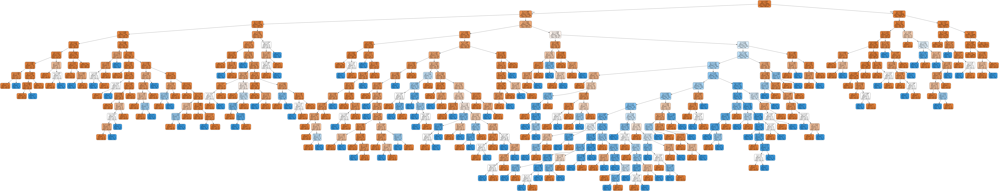

In [88]:
dot_data = StringIO()
export_graphviz(
            modelbig, #note name change
            out_file =  dot_data,
            feature_names = list(X_trainb.columns), #here too
            class_names = ['Not var','Var'],
            filled = True,
rounded = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Now let's take a look at those colors and then evaluate how the tree is doing on the training set.

In [89]:
#Fill

ypred = modelbig.predict(X_testb)

ypred_train = modelbig.predict(X_trainb)

print(metrics.accuracy_score(y_trainb, ypred_train)) #accuracy on train set

print(metrics.accuracy_score(y_testb, ypred)) #accuracy on test set








1.0
0.9951902430645023


The accuracy is high, as expected! But is it meaningful? 

In an unbalanced data set, other metrics are needed.

In [90]:
#Define recall, estimate

print(metrics.recall_score(y_trainb, ypred_train)) #recall on train set

print(metrics.recall_score(y_testb, ypred)) #recall on test set


1.0
0.6018518518518519


In [91]:
#Define precision, estimate

print(metrics.precision_score(y_trainb, ypred_train)) #prec on train set

print(metrics.precision_score(y_testb, ypred)) #prec on test set

1.0
0.48507462686567165


In [92]:
metrics.confusion_matrix(y_testb, ypred)

array([[23109,    69],
       [   43,    65]])

### Recap: what have we seen so far?

Let's talk about what we should be doing to optimize this classifier, going back to the tools we mentioned.

In [32]:
#Ideas here.

# 1. Keep the DT simpler

# 2. Find a way to deal with imbalance

# 3. Do k-fold cross validation



In [33]:
modelbig

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=5,
            splitter='best')

In [34]:
# We can customize this cell as we try new models

modelX = DecisionTreeClassifier(class_weight='balanced')
modelX.fit(X_trainb,y_trainb)
dot_data = StringIO()
export_graphviz(
            modelX,
            out_file =  dot_data,
            feature_names = list(X_trainb.columns),
            class_names = ['Not var','Var'],
            filled = True,
rounded = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [76]:
#And then look at some of these

print('Train/test accuracy {:.3f}, {:.3f}'.format(metrics.accuracy_score(y_trainb,modelX.predict(X_trainb)), \
metrics.accuracy_score(y_testb, modelX.predict(X_testb))))

print('Train/test precision {:.3f}, {:.3f}'.format(metrics.precision_score(y_trainb,modelX.predict(X_trainb)), \
metrics.precision_score(y_testb, modelX.predict(X_testb))))

print('Train/test recall {:.3f}, {:.3f}'.format(metrics.recall_score(y_trainb,modelX.predict(X_trainb)), \
metrics.recall_score(y_testb, modelX.predict(X_testb))))

Train/test accuracy 1.000, 0.995
Train/test precision 1.000, 0.504
Train/test recall 1.000, 0.620


Doesn't look like that helped much with the high variance issue :( 

Let's try and build a less overfitt-ey model by limiting max depth

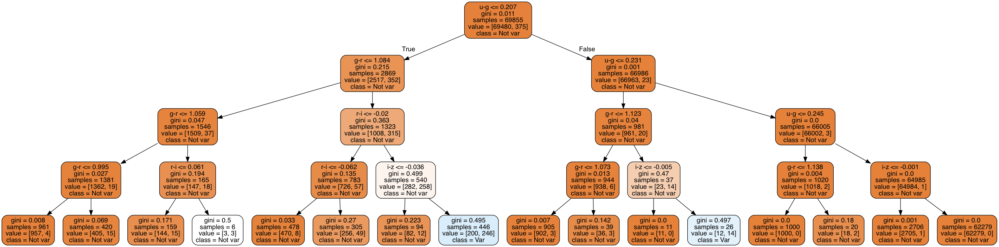

In [95]:
# We can customize this cell as we try new models

modelX = DecisionTreeClassifier(max_depth=4)
modelX.fit(X_trainb,y_trainb)
dot_data = StringIO()
export_graphviz(
            modelX,
            out_file =  dot_data,
            feature_names = list(X_trainb.columns),
            class_names = ['Not var','Var'],
            filled = True,
rounded = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [96]:
#And then look at some of these

print('Train/test accuracy {:.3f}, {:.3f}'.format(metrics.accuracy_score(y_trainb,modelX.predict(X_trainb)), \
metrics.accuracy_score(y_testb, modelX.predict(X_testb))))

print('Train/test precision {:.3f}, {:.3f}'.format(metrics.precision_score(y_trainb,modelX.predict(X_trainb)), \
metrics.precision_score(y_testb, modelX.predict(X_testb))))

print('Train/test recall {:.3f}, {:.3f}'.format(metrics.recall_score(y_trainb,modelX.predict(X_trainb)), \
metrics.recall_score(y_testb, modelX.predict(X_testb))))

Train/test accuracy 0.995, 0.995
Train/test precision 0.551, 0.468
Train/test recall 0.693, 0.685


This is certainly helping with the overfitting by reducing the gap between train and test scores, which makes test scores better (we are apparently picking a better trade-off point). Let's end by combining balancing classes with limiting the tree's depth.

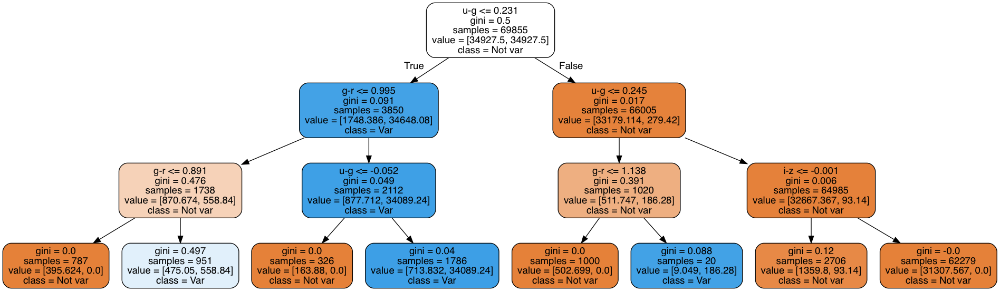

In [97]:
# We can customize this cell as we try new models

modelX = DecisionTreeClassifier(max_depth=3, class_weight='balanced')
modelX.fit(X_trainb,y_trainb)
dot_data = StringIO()
export_graphviz(
            modelX,
            out_file =  dot_data,
            feature_names = list(X_trainb.columns),
            class_names = ['Not var','Var'],
            filled = True,
rounded = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [98]:
#And then look at some of these

print('Train/test accuracy {:.3f}, {:.3f}'.format(metrics.accuracy_score(y_trainb,modelX.predict(X_trainb)), \
metrics.accuracy_score(y_testb, modelX.predict(X_testb))))

print('Train/test precision {:.3f}, {:.3f}'.format(metrics.precision_score(y_trainb,modelX.predict(X_trainb)), \
metrics.precision_score(y_testb, modelX.predict(X_testb))))

print('Train/test recall {:.3f}, {:.3f}'.format(metrics.recall_score(y_trainb,modelX.predict(X_trainb)), \
metrics.recall_score(y_testb, modelX.predict(X_testb))))

Train/test accuracy 0.966, 0.967
Train/test precision 0.136, 0.122
Train/test recall 0.997, 0.981


The algorithm shows very little overfitting now. However by "pumping" up (I believe the correct word is oversampling) the rare class, we have obtained very high recall and very low precision. Is this better than what we had before? I guess it depends on what we want to do.

Finally, we should do <b> k fold Cross Validation </b> on our chosen model, using cross_val_score to evaluate the scores and cross_val_predict to predict the labels.

In [100]:
#Note: default is accuracy

scores = cross_val_score(modelX, Xbig, ybig, \
                         cv =StratifiedKFold(n_splits=5))

In [102]:
scores.mean(), scores.std()

(0.9717846110584203, 0.002636789991133791)

In [103]:
scores = cross_val_score(modelX, Xbig, ybig, \
                         cv =StratifiedKFold(n_splits=5), scoring= 'recall')

In [104]:
scores.mean(), scores.std()

(0.977233676975945, 0.015257306269409162)

If you want the confusion matrix (or any other metric), cross_val_predict will keep track of the labels on each of the 5 test folds and assemble them together for you!

In [106]:
ypred = cross_val_predict(modelX,Xbig, ybig, cv = StratifiedKFold(n_splits=5))

In [107]:
metrics.confusion_matrix(ybig, ypred)

array([[90041,  2617],
       [   11,   472]])